## Wrangle Data

For my final capstone in Thinkful’s Data Science program, I will be using the Democratic Debate Transcripts 2020 dataset. This dataset was developed using rev.com's to transcribe all the Democratic Primary debates from 2019 and 2020 through the South Carolina debate. This dataset contains information regarding debate location, speaker, speaker comments, and speaking time. My objective is to find the most representative summary in each candidate’s debate responses.

In [1]:
cd /Users/rodrickleary/Downloads

/Users/rodrickleary/Downloads


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

df = pd.read_csv('debate_transcripts_v3_2020-02-26.csv', encoding= 'unicode_escape')

In [3]:
df

,date,debate_name,debate_section,speaker,speech,speaking_time_seconds
0,02-25-2020,South Carolina Democratic Debate Transcript: F...,Part 1: South Carolina Democratic Debate Trans...,Norah ODonnell,"Good evening and welcome, the Democratic presi...",8.0
1,02-25-2020,South Carolina Democratic Debate Transcript: F...,Part 1: South Carolina Democratic Debate Trans...,Gayle King,And Super Tuesday is just a week away and this...,22.0
2,02-25-2020,South Carolina Democratic Debate Transcript: F...,Part 1: South Carolina Democratic Debate Trans...,Norah ODonnell,And CBS News is proud to bring you this debate...,14.0
3,02-25-2020,South Carolina Democratic Debate Transcript: F...,Part 1: South Carolina Democratic Debate Trans...,Gayle King,And we are partnering tonight also with Twitte...,10.0
4,02-25-2020,South Carolina Democratic Debate Transcript: F...,Part 1: South Carolina Democratic Debate Trans...,Norah ODonnell,"Now, here are the rules for the next two hours...",31.0
...,...,...,...,...,...,...
5906,06-26-2019,Transcript from Night 1 of the 2019 June Democ...,Closing Statements,Rachel Maddow,"Senator Warren, you have 45 seconds for the fi...",NaN
5907,06-26-2019,Transcript from Night 1 of the 2019 June Democ...,Closing Statements,Elizabeth Warren,Thank you. Its a great honor to be here. Neve...,NaN
5908,06-26-2019,Transcript from Night 1 of the 2019 June Democ...,Closing Statements,Elizabeth Warren,But I got my chance. It was a 50 dollar a seme...,NaN
5909,06-26-2019,Transcript from Night 1 of the 2019 June Democ...,Closing Statements,Savannah G.,We would like to thank all of the candidates t...,NaN


## Data Cleaning

#### Getting Variable Types

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5911 entries, 0 to 5910
Data columns (total 6 columns):
date                     5911 non-null object
debate_name              5911 non-null object
debate_section           5911 non-null object
speaker                  5911 non-null object
speech                   5911 non-null object
speaking_time_seconds    5395 non-null float64
dtypes: float64(1), object(5)
memory usage: 277.2+ KB


In [5]:
for column_name in df.columns:
    print("Unique values in column {} are: {}".format(column_name, df[column_name].unique()))

Unique values in column date are: ['02-25-2020' '02-19-2020' '02-07-2020' '01-14-2020' '12-19-2019'
 '11-20-2019' '10-15-2019' '09-12-2019' '07-31-2019' '07-30-2019'
 '06-27-2019' '06-26-2019']
Unique values in column debate_name are: ['South Carolina Democratic Debate Transcript: February 25 Democratic Debate'
 'Democratic Debate Transcript: Las Vegas, Nevada Debate'
 'New Hampshire Democratic Debate Transcript'
 'January Iowa Democratic Debate Transcript'
 'December Democratic Debate Transcript: Sixth Debate from Los Angeles'
 'November Democratic Debate Transcript \x96 5th Debate Transcript from Atlanta'
 'October Democratic Debate Transcript: 4th Debate in Ohio'
 'September Houston Democratic Debate Transcript \x96 Third Debate'
 'Transcript of July Democratic Debate 2nd Round, Night 2: Full Transcript July 31, 2019'
 'Transcript of July Democratic Debate 2nd Round Night 1: Full Transcript July 30, 2019'
 'Transcript from Night 2 of the First 2019 June Democratic Debates'
 'Transcr

#### Missing Data

In [6]:
df.isnull().sum()*100/df.isnull().count()

date                     0.000000
debate_name              0.000000
debate_section           0.000000
speaker                  0.000000
speech                   0.000000
speaking_time_seconds    8.729487
dtype: float64

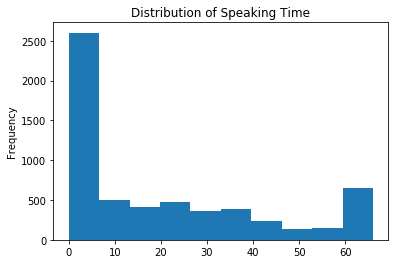

In [7]:
from scipy.stats.mstats import winsorize
plt.hist(winsorize(df['speaking_time_seconds'],(0,0.10)))
plt.title('Distribution of Speaking Time')
plt.ylabel('Frequency')
plt.show()

The output above shows that the data is skewed. Because of this, it makes the most sense to replace the missing values in the speaking time seconds column with the median value.

In [8]:
for column in df.select_dtypes(include=[np.float64,np.int64]):
    df[column].fillna(df[column].median(), inplace=True)

In [9]:
df.isnull().sum()*100/df.isnull().count()

date                     0.0
debate_name              0.0
debate_section           0.0
speaker                  0.0
speech                   0.0
speaking_time_seconds    0.0
dtype: float64

#### Outliers

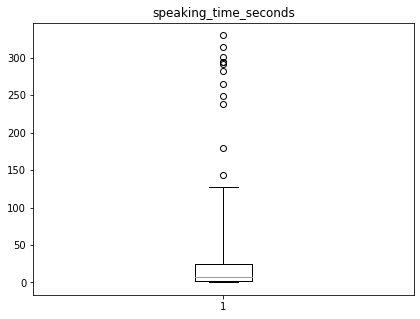

In [10]:
for column in df.select_dtypes(include=[np.float64,np.int64]):    
    plt.figure(figsize = (15,5))

    plt.subplot(1,2,1)
    plt.boxplot(df[column], whis = 5)
    plt.title(column)

From the boxplot above, we can see that their are outliers above 125 seconds, so we will winsorize those outliers and plot a new boxplot.

In [11]:
df['speaking_time_seconds'] = winsorize(df['speaking_time_seconds'], (0, 0.10))

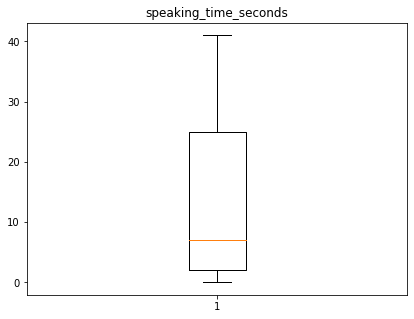

In [12]:
for column in df.select_dtypes(include=[np.float64,np.int64]):    
    plt.figure(figsize = (15,5))

    plt.subplot(1,2,1)
    plt.boxplot(df[column], whis = 5)
    plt.title(column)

In [14]:
df['speaking_time_seconds'].describe()

count    5911.000000
mean       13.998985
std        14.330992
min         0.000000
25%         2.000000
50%         7.000000
75%        25.000000
max        41.000000
Name: speaking_time_seconds, dtype: float64

From the boxplot and description above, we can see that the average comment is about 14 seconds. The minimum is 0 seconds and the maximum is 41 seconds. Additionally, most comments fall approximately between 2 and 25 seconds.

## Feature Engineering

Next, we will filter out the comments that were spoken by individuals other than the presidential candidates.

In [15]:
target_for_values = {
    'Kirsten Gillibrand': ['Kirseten Gillibrand'], 
    'John Hickenlooper': ['John Hickenloop', 'J. Hickenlooper'],
    'Eric Swalwell': ['Eric Stalwell'],
    'Michael Bennet': ['Bennett']}

for k, v in target_for_values.items():
    df.loc[df['speaker'].isin(v), 'speaker'] = k

In [16]:
candidates = ['Bernie Sanders', 'Michael Bloomberg','Pete Buttigieg', 'Elizabeth Warren', 'Tom Steyer', 'Joe Biden', 'Amy Klobuchar', 'Andrew Yang', 'Kamala Harris', 'Cory Booker', 'Tulsi Gabbard', 'Beto O\x92Rourke', 'Bill de Blasio', 'Michael Bennet', 'Jay Inslee', 'Kirsten Gillibrand', 'John Delaney', 'John Hickenlooper', 'Eric Swalwell', 'Marianne Williamson']

df = df[df['speaker'].isin(candidates)]

In [17]:
df

,date,debate_name,debate_section,speaker,speech,speaking_time_seconds
5,02-25-2020,South Carolina Democratic Debate Transcript: F...,Part 1: South Carolina Democratic Debate Trans...,Bernie Sanders,"Well, youre right, the economy is doing reall...",41.0
6,02-25-2020,South Carolina Democratic Debate Transcript: F...,Part 1: South Carolina Democratic Debate Trans...,Michael Bloomberg,Senator-,5.0
8,02-25-2020,South Carolina Democratic Debate Transcript: F...,Part 1: South Carolina Democratic Debate Trans...,Michael Bloomberg,I think that Donald Trump thinks it would be b...,19.0
9,02-25-2020,South Carolina Democratic Debate Transcript: F...,Part 1: South Carolina Democratic Debate Trans...,Bernie Sanders,"Oh, Mr. Bloomberg. Let me tell Mr. Putin. Okay...",27.0
11,02-25-2020,South Carolina Democratic Debate Transcript: F...,Part 1: South Carolina Democratic Debate Trans...,Pete Buttigieg,We know what the President what Russia wants...,3.0
...,...,...,...,...,...,...
5902,06-26-2019,Transcript from Night 1 of the 2019 June Democ...,Closing Statements,Beto ORourke,daughter Molly turned 11 this week. Im on the...,7.0
5903,06-26-2019,Transcript from Night 1 of the 2019 June Democ...,Closing Statements,Beto ORourke,"If were going to be there for them, if were ...",7.0
5904,06-26-2019,Transcript from Night 1 of the 2019 June Democ...,Closing Statements,Beto ORourke,"Join us. This is our moment, and the generatio...",7.0
5907,06-26-2019,Transcript from Night 1 of the 2019 June Democ...,Closing Statements,Elizabeth Warren,Thank you. Its a great honor to be here. Neve...,7.0


In [18]:
for column_name in df.columns:
    print("Unique values in column {} are: {}".format(column_name, df[column_name].unique()))

Unique values in column date are: ['02-25-2020' '02-19-2020' '02-07-2020' '01-14-2020' '12-19-2019'
 '11-20-2019' '10-15-2019' '09-12-2019' '07-31-2019' '07-30-2019'
 '06-27-2019' '06-26-2019']
Unique values in column debate_name are: ['South Carolina Democratic Debate Transcript: February 25 Democratic Debate'
 'Democratic Debate Transcript: Las Vegas, Nevada Debate'
 'New Hampshire Democratic Debate Transcript'
 'January Iowa Democratic Debate Transcript'
 'December Democratic Debate Transcript: Sixth Debate from Los Angeles'
 'November Democratic Debate Transcript \x96 5th Debate Transcript from Atlanta'
 'October Democratic Debate Transcript: 4th Debate in Ohio'
 'September Houston Democratic Debate Transcript \x96 Third Debate'
 'Transcript of July Democratic Debate 2nd Round, Night 2: Full Transcript July 31, 2019'
 'Transcript of July Democratic Debate 2nd Round Night 1: Full Transcript July 30, 2019'
 'Transcript from Night 2 of the First 2019 June Democratic Debates'
 'Transcr

## Exploratory Data Analysis

In [19]:
df['speaker'].value_counts()

Joe Biden              456
Elizabeth Warren       440
Bernie Sanders         430
Pete Buttigieg         392
Amy Klobuchar          353
Kamala Harris          196
Cory Booker            146
Tom Steyer             144
Beto ORourke          113
Andrew Yang            106
Michael Bloomberg       97
Tulsi Gabbard           77
John Delaney            68
Kirsten Gillibrand      67
Michael Bennet          64
Bill de Blasio          60
Marianne Williamson     52
Jay Inslee              23
Eric Swalwell           21
John Hickenlooper       12
Name: speaker, dtype: int64

In [20]:
df['speaker'].value_counts(normalize=True)

Joe Biden              0.137474
Elizabeth Warren       0.132650
Bernie Sanders         0.129635
Pete Buttigieg         0.118179
Amy Klobuchar          0.106421
Kamala Harris          0.059090
Cory Booker            0.044016
Tom Steyer             0.043413
Beto ORourke          0.034067
Andrew Yang            0.031957
Michael Bloomberg      0.029243
Tulsi Gabbard          0.023214
John Delaney           0.020500
Kirsten Gillibrand     0.020199
Michael Bennet         0.019295
Bill de Blasio         0.018089
Marianne Williamson    0.015677
Jay Inslee             0.006934
Eric Swalwell          0.006331
John Hickenlooper      0.003618
Name: speaker, dtype: float64

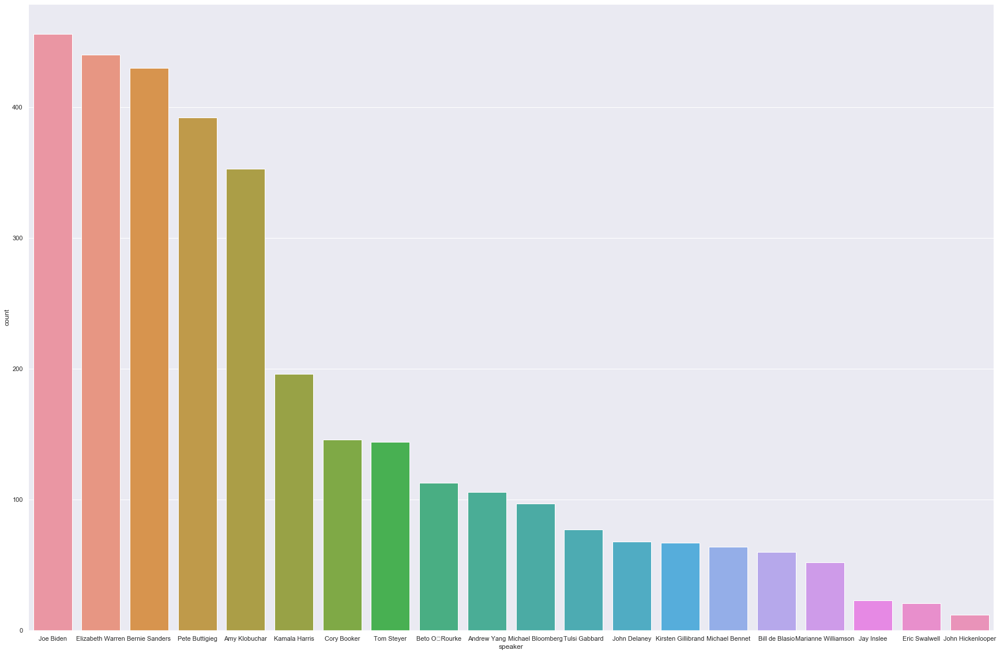

In [23]:
sns.countplot(x='speaker', data=df, order = df['speaker'].value_counts().index)
sns.set(rc={'figure.figsize':(30,20)})

The descriptions and bar graph above show that Joe Biden had the highest number of individual comments.

In [24]:
Median_Comment_Length = df.groupby('speaker', as_index=False)['speaking_time_seconds'].median().sort_values('speaking_time_seconds', ascending=False)
display(Median_Comment_Length)

,speaker,speaking_time_seconds
1,Andrew Yang,29.0
18,Tom Steyer,27.0
19,Tulsi Gabbard,21.0
17,Pete Buttigieg,20.0
11,John Hickenlooper,20.0
9,Joe Biden,19.0
0,Amy Klobuchar,19.0
5,Cory Booker,19.0
12,Kamala Harris,17.5
6,Elizabeth Warren,16.5


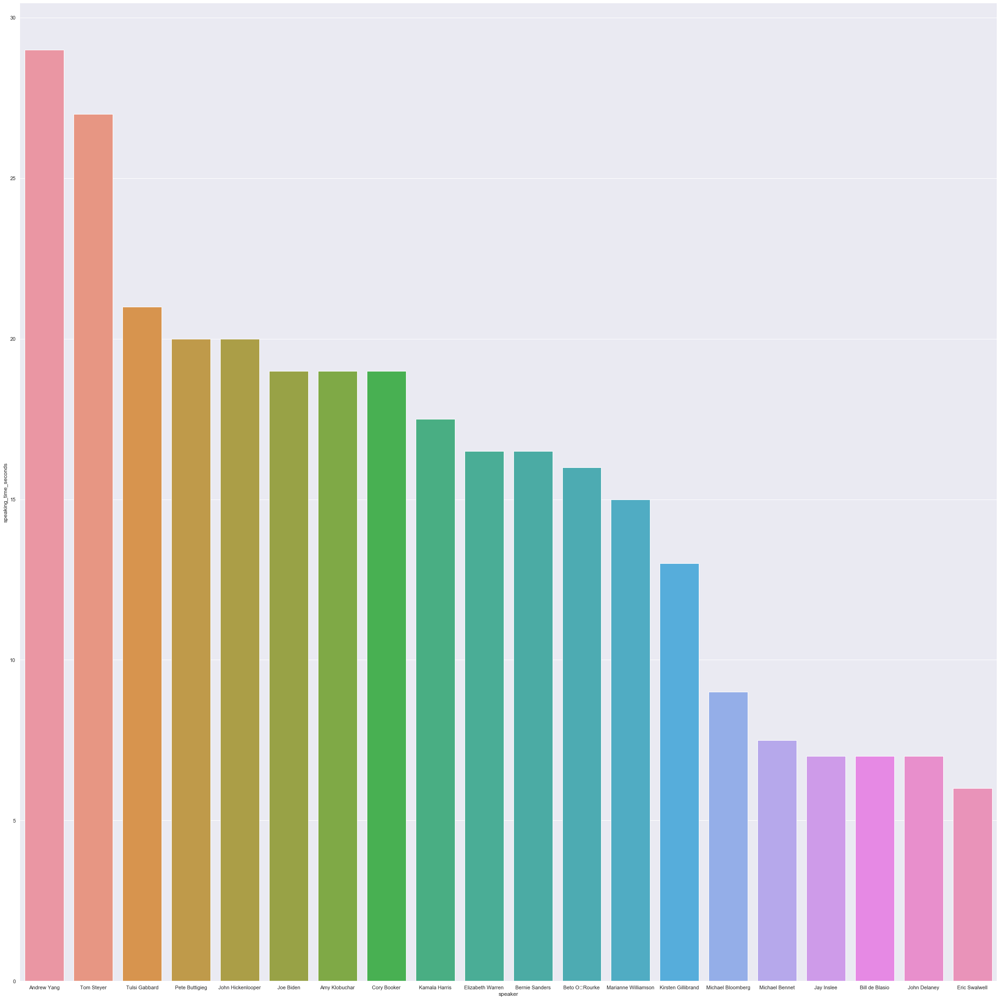

In [25]:
q = sns.catplot(x="speaker", y = 'speaking_time_seconds', data=Median_Comment_Length, height=30, kind="bar")
q.despine(left=True)

The description and bar graph above show that Andrew Yang had the highest median speaking time per comment. 

In [26]:
Total_Speaking_Time = df.groupby('speaker', as_index=False)['speaking_time_seconds'].sum().sort_values('speaking_time_seconds', ascending=False)
display(Total_Speaking_Time)

,speaker,speaking_time_seconds
9,Joe Biden,8722.0
6,Elizabeth Warren,8405.0
2,Bernie Sanders,7984.0
17,Pete Buttigieg,7681.0
0,Amy Klobuchar,7008.0
12,Kamala Harris,3657.0
18,Tom Steyer,3206.0
5,Cory Booker,3029.0
1,Andrew Yang,2874.0
3,Beto ORourke,2092.0


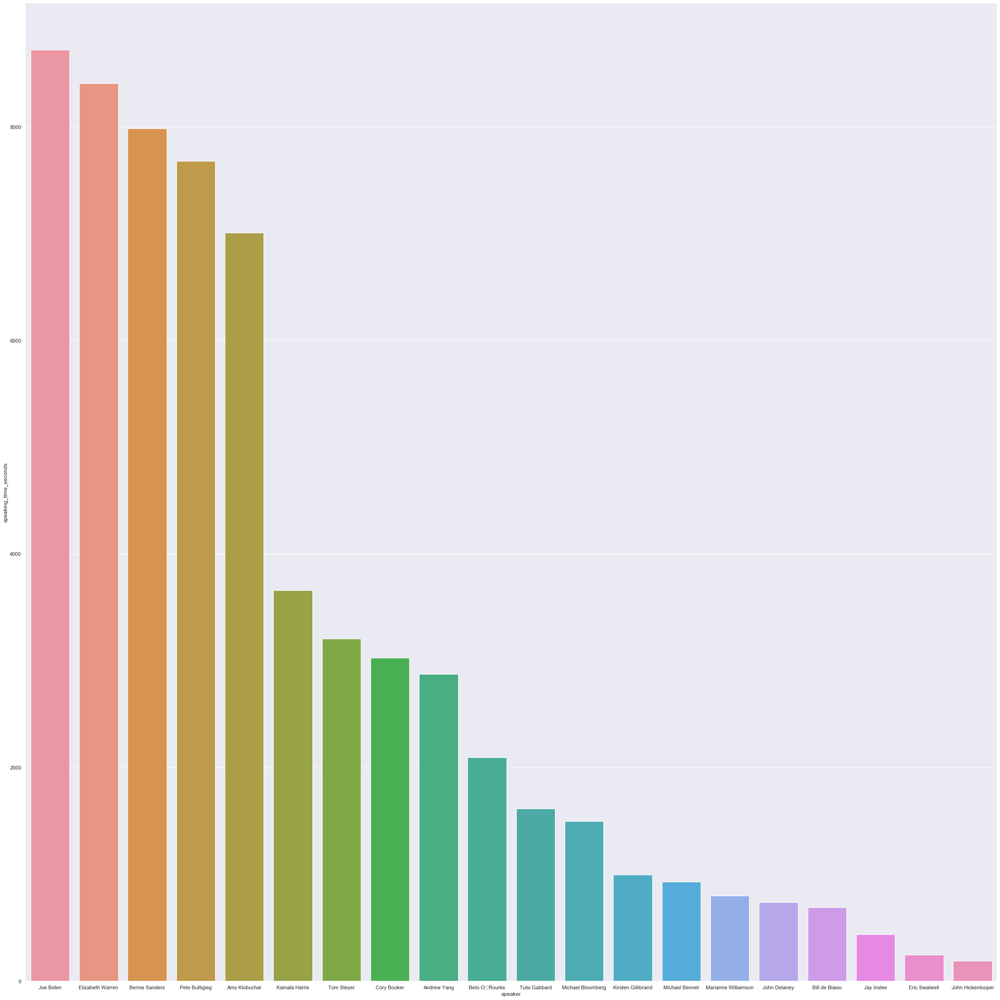

In [27]:
a = sns.catplot(x="speaker", y = 'speaking_time_seconds', data=Total_Speaking_Time, height=30, kind="bar")
a.despine(left=True)

The description and bar graph above show that Joe Biden had the highest total speaking time.

# Build a modeling pipeline

In [16]:
dfsum = df.groupby('speaker', as_index=False)['speech'].sum()
display(dfsum)

,speaker,speech
0,Amy Klobuchar,"Yes, and I think that what we need to do inste..."
1,Andrew Yang,"First, let me say America, its great to be ba..."
2,Bernie Sanders,"Well, youre right, the economy is doing reall..."
3,Beto ORourke,"You know, I think about everyone whos ever se..."
4,Bill de Blasio,"To the working people of America, tonight I br..."
5,Cory Booker,"Well, first of all, I think we all agree that ..."
6,Elizabeth Warren,"Look, the way I see this is that Bernie is win..."
7,Eric Swalwell,"Jose, Ive got $100,000 in student loan debt m..."
8,Jay Inslee,"Good evening, Im Jay Inslee. I am running for..."
9,Joe Biden,"We talk about progressive, lets talk about be..."


#### Extractive Text Summarization

In [17]:
debate_summary = {}

In [18]:
import re
# Utility function for standard text cleaning.
def text_cleaner(text):
    text = re.sub(r'--',' ',text)
    text = re.sub("[\[].*?[\]]", "", text)
    text = ' '.join(text.split())
    return text

In [19]:
from __future__ import unicode_literals, print_function
from spacy.lang.en import English # updated
import spacy
parser = spacy.load('en')

nlp = English()
nlp.add_pipe(nlp.create_pipe('sentencizer'))

for index, row in dfsum.iterrows():
    speech = text_cleaner(row.speech)
    speech = nlp(speech)
    debate_summary[row.speaker] = [[row.speaker, parser(sent.string.strip())] for sent in speech.sents]

In [20]:
debate_summary.values()

dict_values([[['Amy Klobuchar', Yes, and I think that what we need to do instead of just reviewing everything from the past is talk about where were going to go forward.], ['Amy Klobuchar', Martin Luther King once said that we are all tied in a single garment of destiny, and that what affects one of us directly affects all of us indirectly.], ['Amy Klobuchar', So when there is racism in the criminal justice system, then we need to fix it.], ['Amy Klobuchar', And to me that means sentencing reform, like the First Step Act, and extending that to the states with the Second Step Act.], ['Amy Klobuchar', It means equal opportunity, because if we dont pass Representative Clyburns bill out of South Carolina here to invest in impoverished communities, were never going to get to that single garment of destiny.], ['Amy Klobuchar', And we also need to do something about child care, about making sure we increase the minimum wage.], ['Amy Klobuchar', And then, finally, voting.], ['Amy Klobuchar

In [21]:
debate_summary_dfs = []
for k, v in debate_summary.items():
    debate_summary_dfs.append(pd.DataFrame(v, columns=['Speaker', 'Speech']))
debate_summary_df = pd.concat(debate_summary_dfs)
debate_summary_df

,Speaker,Speech
0,Amy Klobuchar,"(Yes, ,, and, I, think, that, what, we, need, ..."
1,Amy Klobuchar,"(Martin, Luther, King, once, said, that, we, a..."
2,Amy Klobuchar,"(So, when, there, is, racism, in, the, crimina..."
3,Amy Klobuchar,"(And, to, me, that, means, sentencing, reform,..."
4,Amy Klobuchar,"(It, means, equal, opportunity, ,, because, if..."
...,...,...
273,Tulsi Gabbard,"(But, thats, not, what, we, have, .)"
274,Tulsi Gabbard,"(Instead, ,, we, have, a, government, that, is..."
275,Tulsi Gabbard,"(This, must, end, .)"
276,Tulsi Gabbard,"(As, president, ,, our, White, House, ,, our, ..."


In [22]:
debate_summary_df.reset_index(drop=True, inplace=True)

In [49]:
sentences = debate_summary_df[['Speech', 'Speaker']]

In [50]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(sentences)

,Speech,Speaker
0,"(Yes, ,, and, I, think, that, what, we, need, to, do, instead, of, just, reviewing, everything, from, the, past, is, talk, about, where, were, going, to, go, forward, .)",Amy Klobuchar
1,"(Martin, Luther, King, once, said, that, we, are, all, tied, in, a, single, garment, of, destiny, ,, and, that, what, affects, one, of, us, directly, affects, all, of, us, indirectly, .)",Amy Klobuchar
2,"(So, when, there, is, racism, in, the, criminal, justice, system, ,, then, we, need, to, fix, it, .)",Amy Klobuchar
3,"(And, to, me, that, means, sentencing, reform, ,, like, the, First, Step, Act, ,, and, extending, that, to, the, states, with, the, Second, Step, Act, .)",Amy Klobuchar
4,"(It, means, equal, opportunity, ,, because, if, we, dont, pass, Representative, Clyburns, bill, out, of, South, Carolina, here, to, invest, in, impoverished, communities, ,, were, never, going, to, get, to, that, single, garment, of, destiny, .)",Amy Klobuchar
5,"(And, we, also, need, to, do, something, about, child, care, ,, about, making, sure, we, increase, the, minimum, wage, .)",Amy Klobuchar
6,"(And, then, ,, finally, ,, voting, .)",Amy Klobuchar
7,"(While, we, are, all, sitting, here, debating, ,, Wisconsin, has, kicked, hundreds, of, thousands-, of, people, off, of, their, voting, rolls, .)",Amy Klobuchar
8,"(Georgia, kicked, 100,000, off, .)",Amy Klobuchar
9,"(As, president-, I, will, get, voting, rights, to, be, a, reality, for, everyone, .)",Amy Klobuchar


In [44]:
debate_summary_2 = {}
for index, row in dfsum.iterrows():
    speech = text_cleaner(row.speech)
    speech = parser(speech)
    debate_summary_2[row.speaker] = speech

In [47]:
import networkx as nx
from sklearn.feature_extraction.text import TfidfVectorizer
debate_summary_speech_ranked = {}

for speaker, speech in debate_summary_2.items():
    sentences1=[]
    
    for span in debate_summary_2[speaker].sents:
#     # go from the start to the end of each span, returning each token in the sentence
#     # combine each token using join()
        sent = ''.join(debate_summary_2[speaker][i].string for i in range(span.start, span.end)).strip()
        sentences1.append(sent)
    # Creating the tf-idf matrix.
    counter = TfidfVectorizer(lowercase=False, 
                          stop_words=None,
                          ngram_range=(1, 1), 
                          analyzer=u'word', 
                          max_df=.5, 
                          min_df=1,
                          max_features=None, 
                          vocabulary=None, 
                          binary=False)

    data_counts=counter.fit_transform(sentences1)
    similarity = data_counts * data_counts.T
    nx_graph = nx.from_scipy_sparse_matrix(similarity)
    ranks=nx.pagerank(nx_graph, alpha=.85, tol=.00000001)
    ranked = sorted(((ranks[i],s) for i,s in enumerate(sentences1)), reverse=True)
    debate_summary_speech_ranked[speaker] = ranked[0]

print(debate_summary_speech_ranked)


{'Amy Klobuchar': (0.0013284183200350285, 'This is an outrageous thing that happened here, and I think we need to talk about this a not only in terms of the horror of what happened here with Turkey, but the fact that our President blew it, and now he\x92s too proud to say it, and what do we do now?'), 'Andrew Yang': (0.003455657709738426, 'If you want to join us in rewriting the rules of the 21st century economy, go to Yang2020.com, and make it so that we can look our kids in the eyes and say to them and believe it, \x93Your country loves you, your country values you and you will be all right.\x94I support impeachment, but we shouldn\x92t have any illusions that impeaching Donald Trump will one be successful or two, erase the problems that got him elected in 2016.'), 'Bernie Sanders': (0.0015270232009229662, 'The answer is if we have the guts that I would like to see the Democratic have that guts, to stand up to the drug companies, and the insurance companies, and tell them that the fu

In [48]:
Representative_Sentences = pd.DataFrame(debate_summary_speech_ranked)
pd.set_option('display.max_colwidth', -1)
display(Representative_Sentences)

,Amy Klobuchar,Andrew Yang,Bernie Sanders,Beto ORourke,Bill de Blasio,Cory Booker,Elizabeth Warren,Eric Swalwell,Jay Inslee,Joe Biden,John Delaney,John Hickenlooper,Kamala Harris,Kirsten Gillibrand,Marianne Williamson,Michael Bennet,Michael Bloomberg,Pete Buttigieg,Tom Steyer,Tulsi Gabbard
0,0.00132842,0.00345566,0.00152702,0.00433322,0.00831291,0.00325012,0.00142277,0.0253784,0.0155004,0.00117895,0.00823055,0.0390984,0.00330743,0.00793407,0.00970925,0.00896251,0.00568075,0.00144528,0.00335239,0.00713673
1,"This is an outrageous thing that happened here, and I think we need to talk about this a not only in terms of the horror of what happened here with Turkey, but the fact that our President blew it, and now hes too proud to say it, and what do we do now?","If you want to join us in rewriting the rules of the 21st century economy, go to Yang2020.com, and make it so that we can look our kids in the eyes and say to them and believe it, Your country loves you, your country values you and you will be all right.I support impeachment, but we shouldnt have any illusions that impeaching Donald Trump will one be successful or two, erase the problems that got him elected in 2016.","The answer is if we have the guts that I would like to see the Democratic have that guts, to stand up to the drug companies, and the insurance companies, and tell them that the function of healthcare is the guaranteed care to all people.","If we set another precedent now that a candidate who invited the participation of a foreign power, a president who sought to obstruct the investigation into the invasion of our democracy, if we allow him to get away with this with complete impunity then we will have set a new standard and that is that some people because of the position of power and public trust that they hold are above the law",But first we have to tell working people in America who are hurting that were going to be on their side every single time against those big corporations who created this mess to begin with and remind people were all in this together.,"If I am President of the United States, we will create an office in the White House to deal with the problem of white supremacy and hate crimes, and we will make sure that systemic racism is dealt with in substantive plans from criminal justice reform to the disparities in healthcare, to even one that we dont talk about enough, which is the racism that we see in environmental injustice in communities of color all around this country.","We need to draw that distinction and show that as Democrats, were not going to be the people who are just out for the big corporations, people who want to help themselves, that we are going to be the party that is willing to fight on the side of the people.","so we remember it in case we have to identify them later a generation who has seen thousands of Black children killed in our streets, and a generation who goes to the theater, and we actually look where the fire exits are.","And I am the candidate and the only one whos saying this has to be the top priority of the United States, the organizing principle to mobilize the United States, so that we can do what weve always done, lead the world and invent the future and put eight million people to work.","It was just the beginning of what will be the future of moving this country beyond where it is now in significant ways, and theres ways to do that, and one of the ways to do that is to make sure you have someone who knows how to get things done, and can lead the free world at the same time.","We should deal with the tragedy of the uninsured and give everyone healthcare as a right, but why do we got to be the party of taking something away",Were going to turn our backs and walk away from people that have risked their lives to help them build a different future for Afghanistan and that part of the world?Thank you.,"And do you understand who the people are?And Im running for president because I believe that we

#### Keyword Summarization

In [31]:
adjacency_dict = {}
for speaker, speech in debate_summary_2.items():
# Removing stop words and punctuation, then getting a list of all unique words in the text
    speech_filt = [word for word in debate_summary_2[speaker] if word.is_stop==False and (word.pos_=='NOUN' or word.pos_=='ADJ')]
    words=set(speech_filt)

#Creating a grid indicating whether words are within 4 places of the target word
    adjacency=pd.DataFrame(columns=words,index=words,data=0)
    
# #Iterating through each word in the text and indicating which of the unique words are its neighbors
    for i,word in enumerate(debate_summary_2[speaker]):
        # Checking if any of the word's next four neighbors are in the word list 
        if any([word == item for item in speech_filt]):
        # Making sure to stop at the end of the string, even if there are less than four words left after the target.
            end=max(0,len(debate_summary_2[speaker])-(len(debate_summary_2[speaker])-(i+5)))
        # The potential neighbors.
            nextwords=debate_summary_2[speaker][i+1:end]
        # Filtering the neighbors to select only those in the word list
            inset=[x in speech_filt for x in nextwords]
            neighbors=[nextwords[i] for i in range(len(nextwords)) if inset[i]]
        # Adding 1 to the adjacency matrix for neighbors of the target word
            if neighbors:
                adjacency.loc[word,neighbors]=adjacency.loc[word,neighbors]+1
    adjacency_dict[speaker] = adjacency

print(adjacency_dict)
print('done')
 

{'Amy Klobuchar':                families  honest  silver  neighbors  kids  American  senators  \
families       0         0       0       0          0     0         0          
honest         0         0       0       0          0     0         0          
silver         0         0       0       0          0     0         0          
neighbors      0         0       0       0          0     0         0          
kids           0         0       0       0          0     0         0          
...           ..        ..      ..      ..         ..    ..        ..          
voter          0         0       0       0          0     0         0          
world          0         0       0       0          0     0         0          
nightclub      0         0       0       0          0     0         0          
international  0         0       0       0          0     0         0          
votes          0         0       0       0          0     0         0          

               right 

In [32]:
# Running TextRank
ranked_words = {}
for speaker, adjacency in adjacency_dict.items():
    nx_words = nx.from_numpy_matrix(adjacency.as_matrix())
    ranks=nx.pagerank(nx_words, alpha=.85, tol=.00000001)
    # Identifying the five most highly ranked keywords
    ranked = sorted(((ranks[i],s) for i,s in enumerate(list(adjacency.columns.values))),reverse=True)
    ranked_words[speaker] = ranked[:5]

print(ranked_words)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  after removing the cwd from sys.path.


{'Amy Klobuchar': [(0.00040031221358212844, issue), (0.00039664378337147204, Democratic), (0.0003753128956811831, majority), (0.0003753128956811831, ones), (0.0003738880243881299, task)], 'Andrew Yang': [(0.0007210745765964045, lot), (0.0007152578249009549, healthcare), (0.0007152578249009549, youd), (0.0007152578249009549, hands), (0.0007151386911451835, roles)], 'Bernie Sanders': [(0.000309291997225789, people), (0.0003089499072611654, miles), (0.00030786869598404713, honest), (0.0003064576692715566, world), (0.0003064576692715566, candidate)], 'Beto O\x92Rourke': [(0.0010189374176050494, allies), (0.0010017828432028208, millions), (0.0010017828432028208, fear), (0.0010017828432028206, free), (0.0009909808173852637, face)], 'Bill de Blasio': [(0.002760010276594195, angry), (0.002538290696486205, sick), (0.0025244251738803475, police), (0.002524425173880346, states), (0.002524425173880346, country)], 'Cory Booker': [(0.0006932372419972592, country), (0.0006379671029607906, lifetime),

In [33]:
Keywords_Table = pd.DataFrame(ranked_words)
pd.set_option('display.max_colwidth', -1)
display(Keywords_Table)

,Amy Klobuchar,Andrew Yang,Bernie Sanders,Beto ORourke,Bill de Blasio,Cory Booker,Elizabeth Warren,Eric Swalwell,Jay Inslee,Joe Biden,John Delaney,John Hickenlooper,Kamala Harris,Kirsten Gillibrand,Marianne Williamson,Michael Bennet,Michael Bloomberg,Pete Buttigieg,Tom Steyer,Tulsi Gabbard
0,"(0.00040031221358212844, issue)","(0.0007210745765964045, lot)","(0.000309291997225789, people)","(0.0010189374176050494, allies)","(0.002760010276594195, angry)","(0.0006932372419972592, country)","(0.0003134740583298128, black)","(0.007362326065448561, student)","(0.003833142065693648, wind)","(0.00033903697850244685, value)","(0.002441036979987479, basic)","(0.012033990718131845, different)","(0.0007836501303571844, child)","(0.002370243122536857, money)","(0.0028294791562118674, fact)","(0.0036514361411829044, lack)","(0.0021290906655130424, foundation)","(0.00033917757837670706, unique)","(0.0007162499670678488, terms)","(0.0012026299269831827, state)"
1,"(0.00039664378337147204, Democratic)","(0.0007152578249009549, healthcare)","(0.0003089499072611654, miles)","(0.0010017828432028208, millions)","(0.002538290696486205, sick)","(0.0006379671029607906, lifetime)","(0.00031060140623933284, brother)","(0.007324884389628899, climate)","(0.003833142065693648, war)","(0.00033903697850244685, humanity)","(0.002379470346377796, American)","(0.012033990718131844, track)","(0.0007836501303571841, importation)","(0.0023702431225368567, opportunity)","(0.0028294791562118674, suffrage)","(0.0034425238434456834, Latin)","(0.0021290906655130424, lot)","(0.00033346726991262204, ready)","(0.0007001782581106076, help)","(0.0012004376107126707, leader)"
2,"(0.0003753128956811831, majority)","(0.0007152578249009549, youd)","(0.00030786869598404713, honest)","(0.0010017828432028208, fear)","(0.0025244251738803475, police)","(0.0006311470231730839, sense)","(0.0003106014062393328, baby)","(0.007324884389628899, guarantee)","(0.003833142065693648, proud)","(0.00033903697850244674, closer)","(0.002379470346377796, carbon)","(0.011972438683609208, economy)","(0.0007393669026168751, cents)","(0.0023702431225368567, carbon)","(0.002829479156211867, world)","(0.0033556982009416213, people)","(0.0021290906655130424, problem)","(0.00033346726991262204, wealth)","(0.0007001782581106076, drug)","(0.0011050421608672424, role)"
3,"(0.0003753128956811831, ones)","(0.0007152578249009549, hands)","(0.0003064576692715566, world)","(0.0010017828432028206, free)","(0.002524425173880346, states)","(0.0006311470231730839, African)","(0.00030097040842234717, fossil)","(0.007324884389628899, technology)","(0.0038331420656936475, sting)","(0.0003208040986643519, jail)","(0.002379470346377796, illegal)","(0.011972438683609208, were)","(0.0007269115506503684, middle)","(0.0023702431225368567, civil)","(0.002829479156211867, cents)","(0.0033556982009416213, class)","(0.0021290906655130424, way)","(0.00033346726991262204, urgency)","(0.0007001782581106076, priority)","(0.0011050421608672424, world)"
4,"(0.0003738880243881299, task)","(0.0007151386911451835, roles)","(0.0003064576692715566, candidate)","(0.0009909808173852637, face)","(0.002524425173880346, country)","(0.0006311470231730839, transparency)","(0.0003005147890006092, right)","(0.007324884389628898, leadership)","(0.0038331420656936475, great)","(0.0003178935888790979, rights)","(0.002379470346377796, workable)","(0.01149680449314091, small)","(0.0007258820873139134, cents)","(0.002370243122536856, access)","(0.002829479156211867, end)","(0.0033449815772580056, private)","(0.0021290906655130424, largest)","(0.00033346726991262204, lower)","(0.0007001782581106076, help)","(0.0011050421608672424, country)"


## Conclusions

The extractive text summarization returns a more representative summary than the keyword summarization. The extractive text summarization models returns sentences that allow the us to gleam each candidates platform based on their debate performances.

The keyword summarization model does not fare as well. While it occasionally returns a word that allows us to gleam a candidates platform, for the most part, it returns words that very generic.

Summarizing a candidate's campaign platform in a short summary can be a great way for not only candidates to get their message out effectively, but also for the news media putting out the information about the candidates to get the information about each candidate out in a way where it is sure to be consumed by the voting public.

In a production-like environment, it would be great for traditional news media and social media, or even a candidates campaign to set up scripts would would allow them to automatically update summaries of a candidates campaign platform in order to provide the public with the most up to date information about each candidate's views in as few words as possible.

## Limitations

I experienced several limitations and shortcoming over the course of this project that provide me with great future directions on where to take this project.

The first limitation that I experienced was the lack of information and readily accessible code on how to perform an abstractive text summary. In the future, I would love to run an abstractive text summary alongside this extractive text summary and evaluate the results.

The next limitation I experienced was the lack of a readily accessible hyperparameter tuning tool for extractive text summarization and keyword summarization models. In the future, I would like to take on the challenge of writing an equivalent of the gridsearchcv function used in supervised learning models in order to develop a readily accessible hyperparameter tool that would allow me to find the best hyperparameters for text summarization models.

My final limitation was the lack of an evaluation tool for extractive and keyword summarization models. During my review of literature I found that text summarizations are normally evaluated two ways. The first is by human evaluation, which consists on an individual reading a summary and comparing it to what they know about the text being summarized. The second is by using the ROUGE package which allows users to compare computer generated summaries to human generated summaries. Because the ROUGE package requires a human generated summary that I did not have readily accessible for the dataset I was evaluating, I chose to use human evaluation to evaluate my models. I believe it would be beneficial for the field of text summarization to develop a more data based approach for evaluating text summarization models when a human generated summary is not available.